There were just some many columns I found it difficult at first to look at them all. I decided to break the columns into groups and observe relationship to 'SalePrice'. Here is the group breakdown:

1) house_corr - Columns that have a correlation with SalePrice > 0.39 or < -0.5 (all int or float types)

2) house_int - Remaining int64 columns not in house_corr

3) house_obj - Remaining object columns not in house_corr


In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

from statsmodels.graphics.api import abline_plot # For visualling evaluating predictions.
import warnings 
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings(action="ignore", module="scipy", message="^internal gelsd")

In [2]:
# Load and view data
house = pd.read_csv('house_cleaned.csv')
pd.set_option('display.max_columns', None)
house

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,Built_to_Sale,Years_Since_Remod
0,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,2,548,Y,0,61,0,0,0,0,0,208500,5,5
1,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,2,460,Y,298,0,0,0,0,0,0,181500,31,31
2,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,2,608,Y,0,42,0,0,0,0,0,223500,7,6
3,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,216,0,540,756,GasA,Gd,Y,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,3,642,Y,0,35,272,0,0,0,0,140000,91,36
4,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,655,0,490,1145,GasA,Ex,Y,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,3,836,Y,192,84,0,0,0,0,0,250000,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,PConc,0,0,953,953,GasA,Ex,Y,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,2,460,Y,0,40,0,0,0,0,0,175000,8,7
1456,20,RL,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Gable,CompShg,Plywood,Plywood,119.0,TA,TA,CBlock,790,163,589,1542,GasA,TA,Y,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,2,500,Y,349,0,0,0,0,0,0,210000,32,22
1457,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,Gable,CompShg,CemntBd,CmentBd,0.0,Ex,Gd,Stone,275,0,877,1152,GasA,Ex,Y,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,1,252,Y,0,60,0,0,0,0,2500,266500,69,4
1458,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,49,1029,0,1078,GasA,Gd,Y,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,1,240,Y,366,0,112,0,0,0,0,142125,60,14


In [3]:
# Checking out the info (non-null count and Dtype)
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 58 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MSSubClass         1460 non-null   int64  
 1   MSZoning           1460 non-null   object 
 2   LotArea            1460 non-null   int64  
 3   Street             1460 non-null   object 
 4   LotShape           1460 non-null   object 
 5   LandContour        1460 non-null   object 
 6   Utilities          1460 non-null   object 
 7   LotConfig          1460 non-null   object 
 8   LandSlope          1460 non-null   object 
 9   Neighborhood       1460 non-null   object 
 10  Condition1         1460 non-null   object 
 11  Condition2         1460 non-null   object 
 12  BldgType           1460 non-null   object 
 13  HouseStyle         1460 non-null   object 
 14  OverallQual        1460 non-null   int64  
 15  OverallCond        1460 non-null   int64  
 16  RoofStyle          1460 

In [4]:
# Creating a correlation matrix (too many numbers, not very useful at first glance)
house.corr()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,Built_to_Sale,Years_Since_Remod
MSSubClass,1.000000,-0.139781,0.032628,-0.059316,0.023573,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.084284,-0.028746,-0.041967
LotArea,-0.139781,1.000000,0.105806,-0.005636,0.103321,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.263843,-0.014832,-0.014611
OverallQual,0.032628,0.105806,1.000000,-0.091932,0.407252,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.790982,-0.572629,-0.552498
OverallCond,-0.059316,-0.005636,-0.091932,1.000000,-0.125694,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.077856,0.377325,-0.070950
MasVnrArea,0.023573,0.103321,0.407252,-0.125694,1.000000,0.261256,-0.071330,0.113862,0.360067,0.339850,0.173800,-0.068628,0.388052,0.083010,0.027403,0.272999,0.199108,0.102775,-0.038450,0.279568,0.247015,0.361945,0.370884,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,0.472614,-0.311479,-0.176991
BsmtFinSF1,-0.069836,0.214103,0.239666,-0.046231,0.261256,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,0.386420,-0.248483,-0.127429
BsmtFinSF2,-0.065649,0.111170,-0.059119,0.040229,-0.071330,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,0.158678,0.070948,-0.076444,-0.032148,-0.015728,-0.040751,-0.035227,0.046921,-0.038264,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.011378,0.050422,0.069807
BsmtUnfSF,-0.140759,-0.002618,0.308159,-0.136841,0.113862,-0.495251,-0.209294,1.000000,0.415360,0.317987,0.004469,0.028167,0.240257,-0.422900,-0.095804,0.288886,-0.041118,0.166643,0.030086,0.250647,0.051575,0.214175,0.183303,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.214479,-0.150619,-0.183813
TotalBsmtSF,-0.238518,0.260833,0.537808,-0.171098,0.360067,0.522396,0.104810,0.415360,1.000000,0.819530,-0.174512,-0.033245,0.454868,0.307351,-0.000315,0.323722,-0.048804,0.050450,-0.068901,0.285573,0.339519,0.434585,0.486665,0.232019,0.247264,-0.095478,0.037384,0.084489,0.126053,-0.018479,0.613581,-0.391498,-0.291949
1stFlrSF,-0.251758,0.299475,0.476224,-0.144203,0.339850,0.445863,0.097117,0.317987,0.819530,1.000000,-0.202646,-0.014241,0.566024,0.244671,0.001956,0.380637,-0.119916,0.127401,0.068101,0.409516,0.410531,0.439317,0.489782,0.235459,0.211671,-0.065292,0.056104,0.088758,0.131525,-0.021096,0.605852,-0.282143,-0.241149


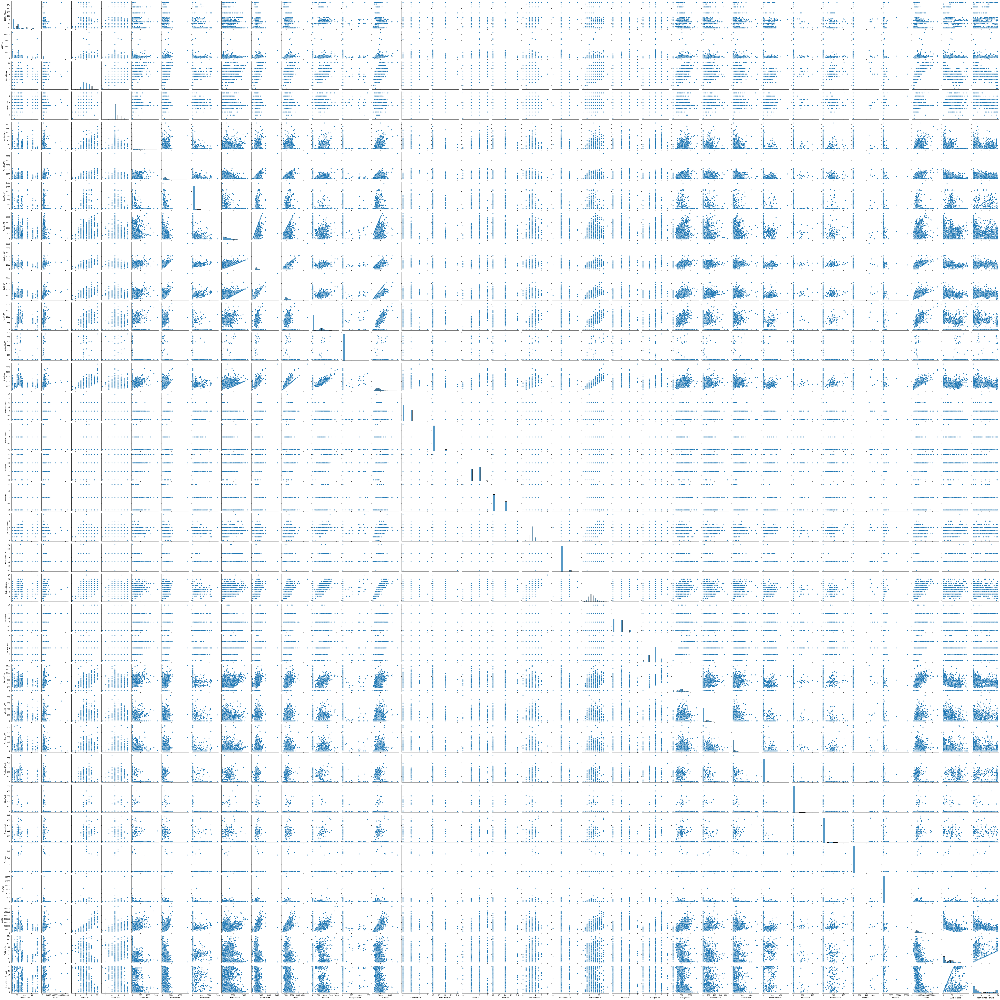

In [5]:
# Too many plots, not very helpful at first glance
sns.pairplot(house)

In [6]:
# Seting the the Matplotlib plot dimensions (focusing on the SalePrice relationship)
plt.figure(figsize=(200,150))
sns.set(font_scale=10)

# Creating an annotated heatmap of the correlations
sns.heatmap(house.corr(), annot=True, cmap="PiYG", annot_kws={"fontsize":90})


<AxesSubplot:>

In [7]:
# Columns that have a correlation with SalePrice > 0.39 or < -0.5
columns = ['SalePrice', 'OverallQual', 'MasVnrArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'FullBath', 
           'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'Built_to_Sale', 'Years_Since_Remod']
house_corr = house[columns]
house_corr.dtypes

SalePrice              int64
OverallQual            int64
MasVnrArea           float64
BsmtFinSF1             int64
TotalBsmtSF            int64
1stFlrSF               int64
GrLivArea              int64
FullBath               int64
TotRmsAbvGrd           int64
Fireplaces             int64
GarageCars             int64
GarageArea             int64
Built_to_Sale          int64
Years_Since_Remod      int64
dtype: object

<AxesSubplot:>

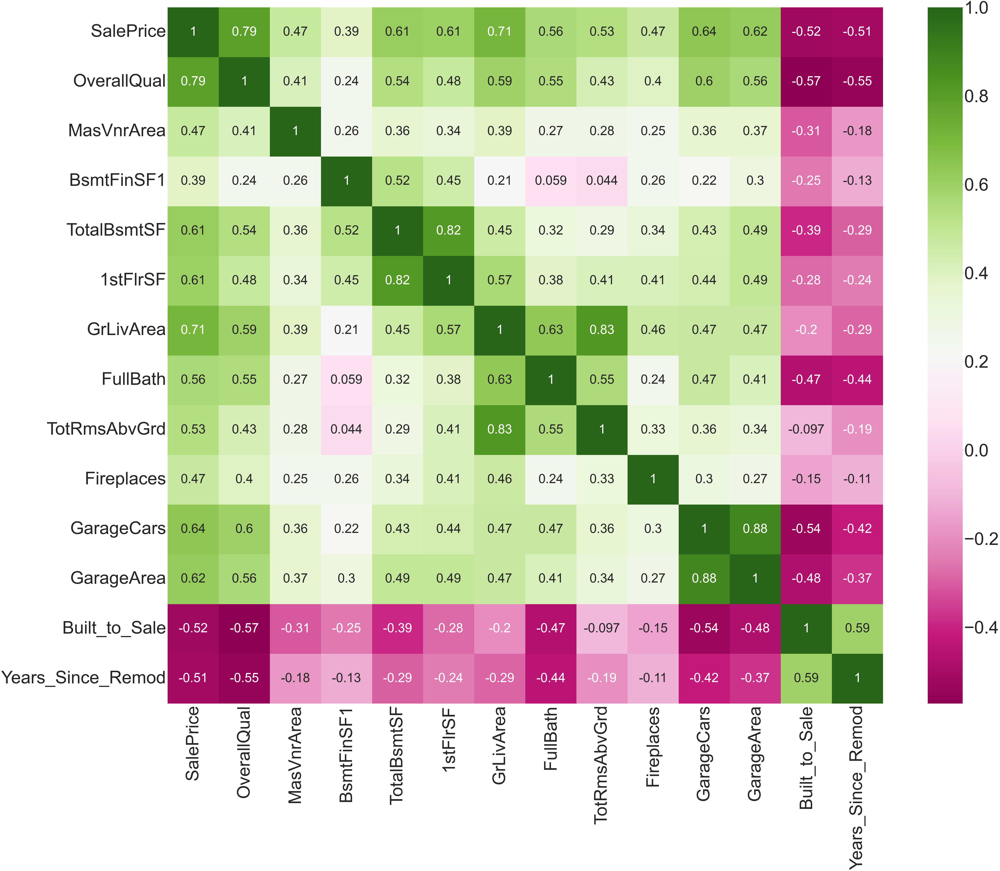

In [8]:
# Setting figure size
plt.figure(figsize=(100,80))
sns.set(font_scale=10)

# Creating an annotated heatmap of the correlations (focusing on the SalePrice relationship)
sns.heatmap(house_corr.corr(), annot=True, cmap="PiYG",annot_kws={"size": 80 })

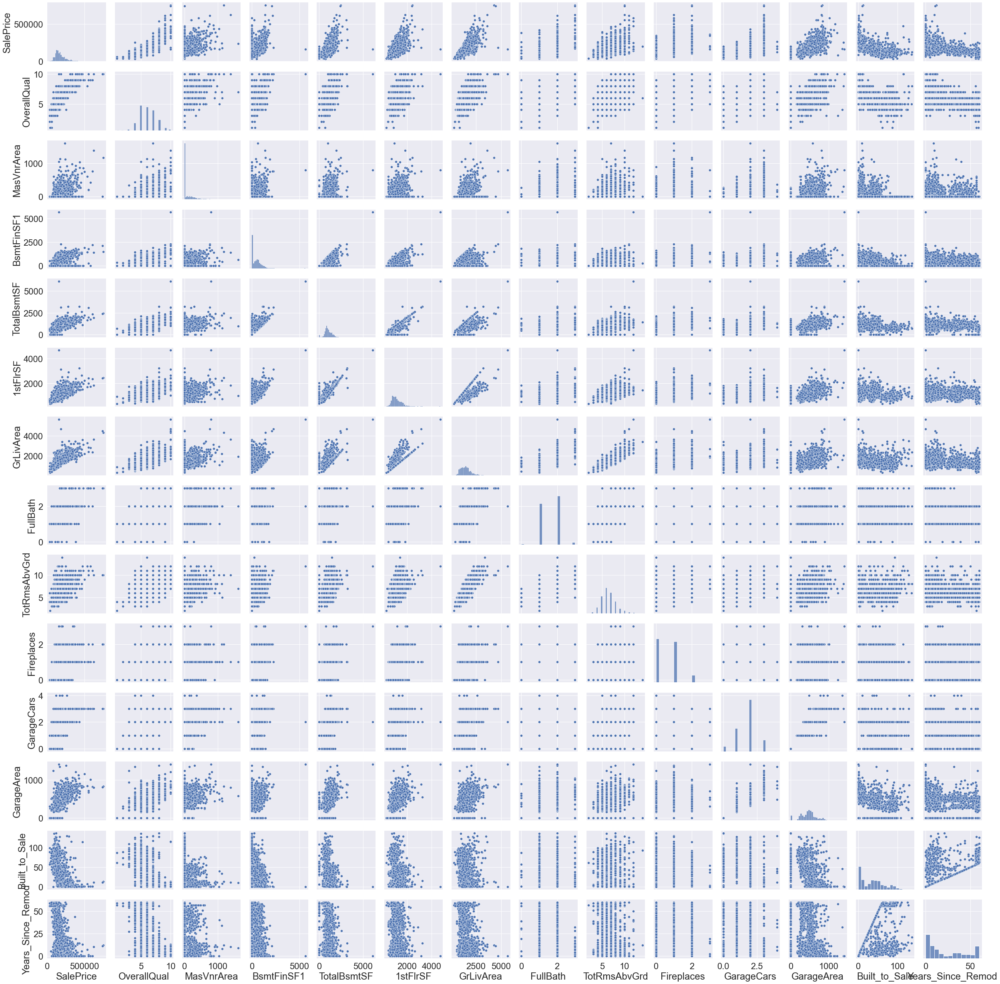

In [9]:
# Adjusting font
sns.set(font_scale=2)

# pairplot with house_corr dataframe (better viewability than before)
sns.pairplot(house_corr)
plt.show()

In [10]:
# Loop for creating individual scatterplots (too large to a lot of data at one time)
'''
for col in columns:
    
    sns.scatterplot(x=col, y='SalePrice', data=house_corr)
    plt.title(col + ' vs. SalePrice')
    plt.show()
    print('correlation =' + str(house_corr['SalePrice'].corr(house_corr[col])))
'''

"\nfor col in columns:\n    \n    sns.scatterplot(x=col, y='SalePrice', data=house_corr)\n    plt.title(col + ' vs. SalePrice')\n    plt.show()\n    print('correlation =' + str(house_corr['SalePrice'].corr(house_corr[col])))\n"

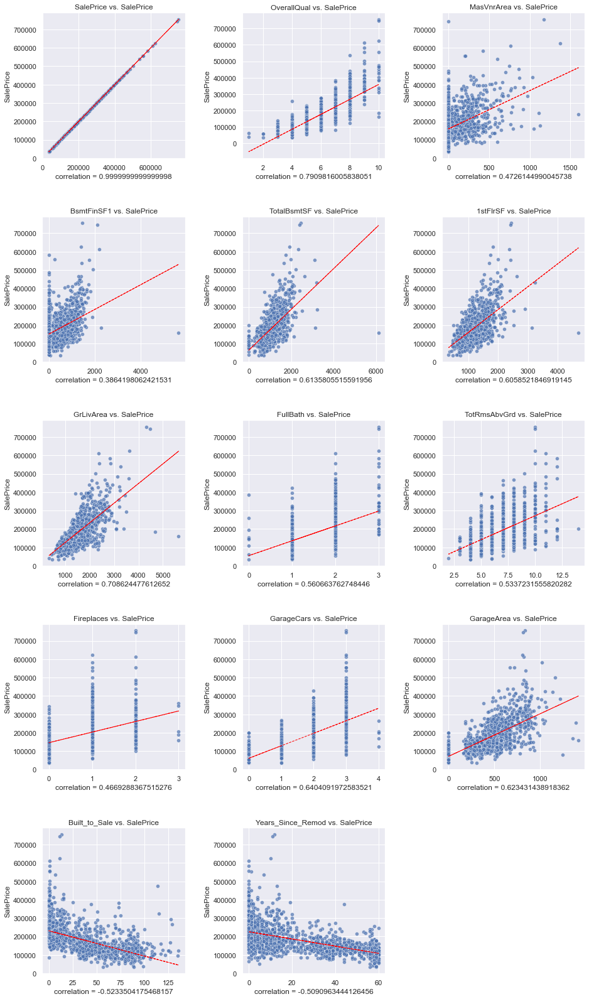

In [11]:
# Decided to make subplotted scatter plots in order to see more data on the screen at one time
sns.set(font_scale=1)
plt.figure(figsize=(15, 25))
plt.subplots_adjust(hspace=0.1)
#plt.suptitle("Sale Prices", fontsize=18, y=0.95)

# set number of columns (use 3 to demonstrate the change)
ncols = 3
# calculate number of rows
nrows = len(columns) // ncols + (len(columns) % ncols > 0)

# loop through the length of df and keep track of index
for n, col in enumerate(columns):
    
    # add a new subplot iteratively using nrows and cols
    ax = plt.subplot(nrows, ncols, n + 1)

    # actual scatter plot
    sns.scatterplot(house_corr[col],house_corr['SalePrice'], alpha=0.7)
    
    # find line of best fit
    a, b = np.polyfit(house_corr[col],house_corr['SalePrice'], 1)
    # add line of best fit to plot
    plt.plot(house_corr[col], a*house_corr[col]+b, color='red', linestyle='--', linewidth=1)

    ax.set_title(col + ' vs. SalePrice')
    ax.set_xlabel('correlation = ' + str(house_corr['SalePrice'].corr(house_corr[col])))
    #ax.set_ylabel('SalePrice')
    
plt.subplots_adjust(left=0.1, bottom=0.05, right=0.9, top=0.9, wspace=0.4, hspace=0.4)   



In [12]:
# Creating a dataframe of columns not in the correlation dataframe
not_columns = ['SalePrice','MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
       'ExterQual', 'ExterCond', 'Foundation',
       'BsmtFinSF2', 'BsmtUnfSF', 'Heating', 'HeatingQC',
       'CentralAir', '2ndFlrSF', 'LowQualFinSF',
       'BsmtFullBath', 'BsmtHalfBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'Functional',
       'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal']

house_corr_not = house[not_columns]
house_corr_not

,SalePrice,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
0,208500,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,5,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,0,150,GasA,Ex,Y,854,0,1,0,1,3,1,Gd,Typ,Y,0,61,0,0,0,0,0
1,181500,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,8,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,0,284,GasA,Ex,Y,0,0,0,1,0,3,1,TA,Typ,Y,298,0,0,0,0,0,0
2,223500,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,5,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,0,434,GasA,Ex,Y,866,0,1,0,1,3,1,Gd,Typ,Y,0,42,0,0,0,0,0
3,140000,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,5,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,0,540,GasA,Gd,Y,756,0,1,0,0,3,1,Gd,Typ,Y,0,35,272,0,0,0,0
4,250000,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,5,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,0,490,GasA,Ex,Y,1053,0,1,0,1,4,1,Gd,Typ,Y,192,84,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,175000,60,RL,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,Gable,CompShg,VinylSd,VinylSd,TA,TA,PConc,0,953,GasA,Ex,Y,694,0,0,0,1,3,1,TA,Typ,Y,0,40,0,0,0,0,0
1456,210000,20,RL,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,Gable,CompShg,Plywood,Plywood,TA,TA,CBlock,163,589,GasA,TA,Y,0,0,1,0,0,3,1,TA,Min1,Y,349,0,0,0,0,0,0
1457,266500,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,9,Gable,CompShg,CemntBd,CmentBd,Ex,Gd,Stone,0,877,GasA,Ex,Y,1152,0,0,0,0,4,1,Gd,Typ,Y,0,60,0,0,0,0,2500
1458,142125,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,Hip,CompShg,MetalSd,MetalSd,TA,TA,CBlock,1029,0,GasA,Gd,Y,0,0,1,0,0,2,1,Gd,Typ,Y,366,0,112,0,0,0,0


In [13]:
house_corr_not.columns

Index(['SalePrice', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtFinSF2', 'BsmtUnfSF', 'Heating',
       'HeatingQC', 'CentralAir', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath',
       'BsmtHalfBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'Functional', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'],
      dtype='object')

In [14]:
house_corr_not.dtypes

SalePrice         int64
MSSubClass        int64
MSZoning         object
LotArea           int64
Street           object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
OverallCond       int64
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
ExterQual        object
ExterCond        object
Foundation       object
BsmtFinSF2        int64
BsmtUnfSF         int64
Heating          object
HeatingQC        object
CentralAir       object
2ndFlrSF          int64
LowQualFinSF      int64
BsmtFullBath      int64
BsmtHalfBath      int64
HalfBath          int64
BedroomAbvGr      int64
KitchenAbvGr      int64
KitchenQual      object
Functional       object
PavedDrive       object
WoodDeckSF        int64
OpenPorchSF       int64
EnclosedPorch     int64
3SsnPorch       

In [15]:
# Splitting new dataframe into int64 and object dataframes
obj_cols = ['SalePrice']
int_cols = []

for col in house_corr_not:
    if house_corr_not[col].dtypes == 'object':
        obj_cols.append(col)

for col in house_corr_not:
    if house_corr_not[col].dtypes == 'int64':
        int_cols.append(col)

house_obj = house[obj_cols]
house_int = house[int_cols]

In [16]:
# Checking to see if all columns are accounted for.
# SalePrice is in all three, so we must subtract 2 to account for that.

len(house.columns) == len(house_corr.columns) + len(house_int.columns) + len(house_obj.columns)-2

True

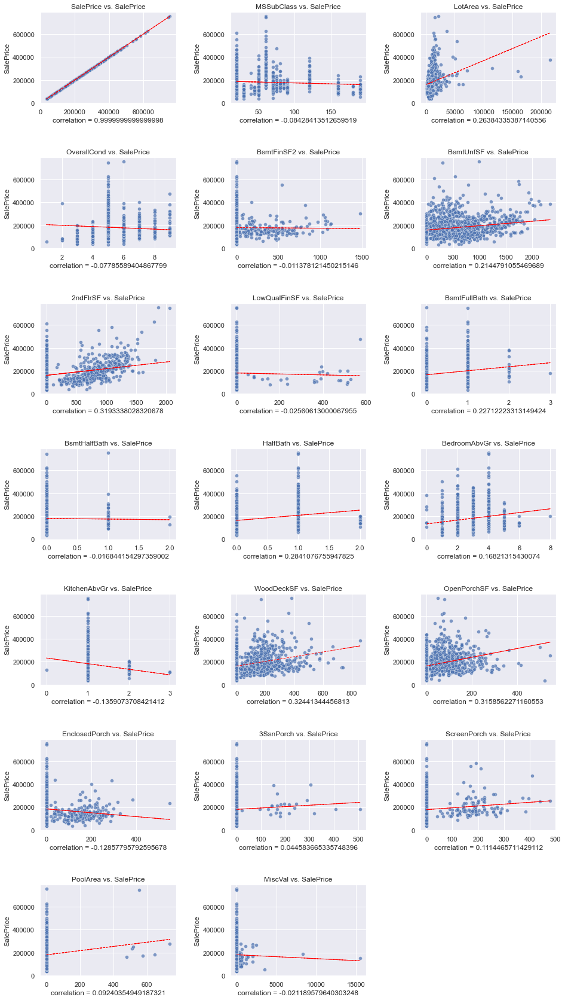

In [17]:
# Plotting the other integer dataframe vs SalePrice
sns.set(font_scale=1)
plt.figure(figsize=(15, 25))
plt.subplots_adjust(hspace=0.0)
#plt.suptitle("Sale Prices", fontsize=18, y=0.95)

# set number of columns (use 3 to demonstrate the change)
ncols = 3
# calculate number of rows
nrows = len(int_cols) // ncols + (len(int_cols) % ncols > 0)

# loop through the length of df and keep track of index
for n, col in enumerate(int_cols):
    
    # add a new subplot iteratively using nrows and cols
    ax = plt.subplot(nrows, ncols, n + 1)

    sns.scatterplot(house_int[col],house_int['SalePrice'], alpha=0.7)
    
    # find line of best fit
    a, b = np.polyfit(house_int[col],house_int['SalePrice'], 1)
    # add line of best fit to plot
    plt.plot(house_int[col], a*house_int[col]+b, color='red', linestyle='--', linewidth=1)

    ax.set_title(col + ' vs. SalePrice')
    ax.set_xlabel('correlation = ' + str(house_int['SalePrice'].corr(house_int[col])))
    ax.set_ylabel('SalePrice')
    
plt.subplots_adjust(left=0.1, bottom=0.005, right=0.9, top=0.9, wspace=0.4, hspace=0.6)  

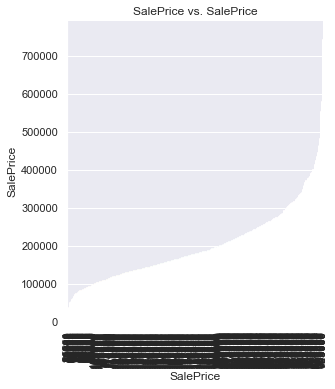

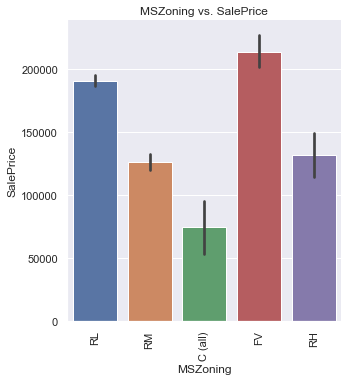

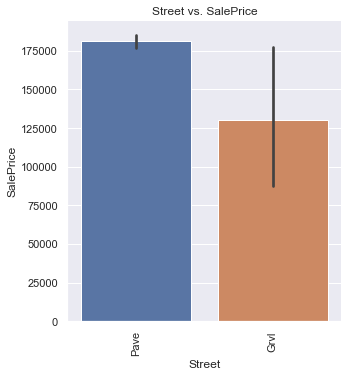

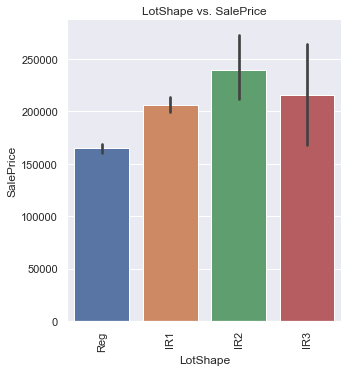

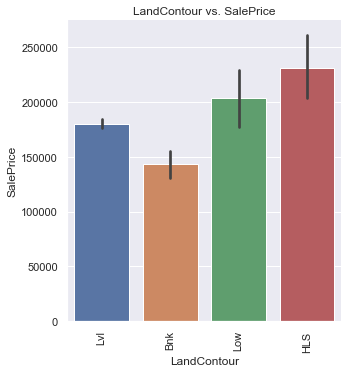

...

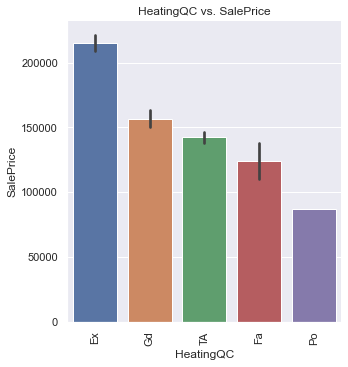

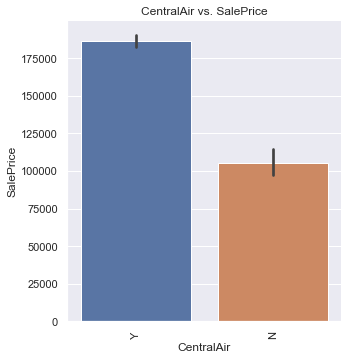

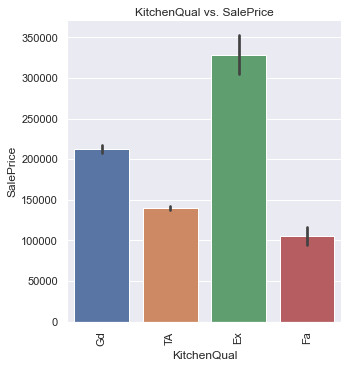

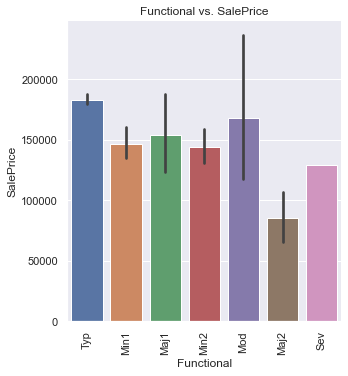

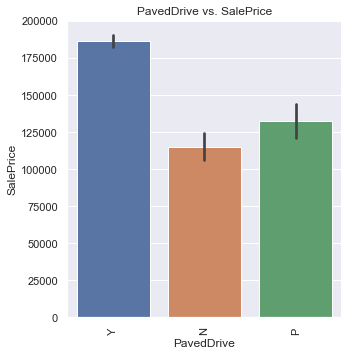

In [18]:
# Creating category plots of the object df
for col in obj_cols:
    sns.catplot(x=col, y='SalePrice', data=house_obj, kind='bar')#, ci=None)
    plt.title(col + ' vs. SalePrice')
    plt.xticks(rotation=90)
    plt.show()